# Jupyter-Notebook zur Signalverarbeitung

Dieses Notebook zeigt Einblicke in die Verarbeitung eines neurophysiologischen Signals. Die mithilfe der Inferenzstatistik analysierten Daten müssen häufig zunächst aus Rohdaten extrahiert werden. Im Folgenden wird eine mögliche Vorgehensweise in diesem Zusammenhang am Beispiel eines Hautleitfähigkeitssignals demonstriert.

## Hautleitfähigkeit
- Auch als Elektrodermale Aktivität (EDA) bezeichnet
- Wird beeinflusst durch die Aktivität des Sympathischen Nervensystems und ist demenstprechend ein Indikator des autonomen Erregungsniveaus 
- Erhöhung bei emotional-affektiven Reaktionen

## Genutze Module
- [Pandas](https://pandas.pydata.org/docs/) zum Einlesen der Daten
- [Matplotlib](https://matplotlib.org/) zur Darstellung der Daten 
- [Scipy](https://scipy.org/) zur Signalverarbeitung 
- [Neurokit2](https://neuropsychology.github.io/NeuroKit/) als maßgeschneidertes Modul zur Hautleitfähigkeitsanalyse 

## Teil 1: Datenverarbeitung

### 1.1 Daten einlesen
- Die Daten wurden mit einer Aufnahmerate von 2000 Hz erfasst 

In [1]:
import pandas as pd

df = pd.read_csv("daten_EDA.txt", sep = '\t', nrows = 40000) # Einlesen der ersten 40 000 Zeilen, entspricht 20 Sekunden
df 

,CH1
0,5.24902
1,5.24902
2,5.24902
3,5.24902
4,5.24902
...,...
39994,8.08105
39995,8.08105
39996,8.08105
39997,8.08105


**Datenstruktur**
- Links befindet sich der Index (Reihennummer)
- In der Spalte "CH1" (Channel 1) befinden sich die Hautleitfähigkeitswerte in der Einheit Mikrosiemens 

In [2]:
df.describe() # Statistische Kennzahlen ausgeben lassen


,CH1
count,39999.000000
mean,6.771823
std,1.175186
min,5.169680
25%,5.657960
50%,6.524660
75%,7.977290
max,8.807370


In [3]:
signal_roh = df['CH1'].values # Erste Spalte als Array abrufen 
signal_roh

array([5.24902, 5.24902, 5.24902, ..., 8.08105, 8.08105, 8.07495])

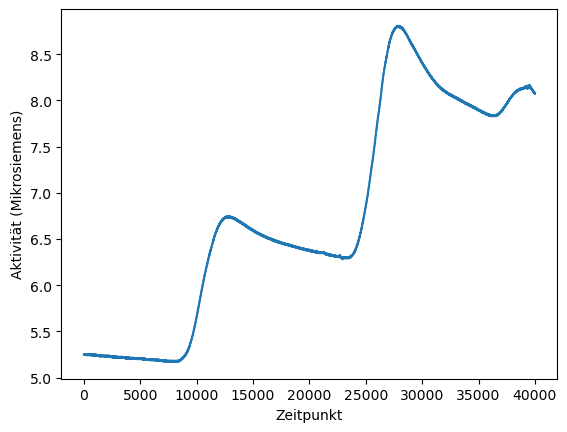

In [4]:
import matplotlib.pyplot as plt

plt.plot(signal_roh) # Darstellung des Signals
plt.xlabel('Zeitpunkt')
plt.ylabel('Aktivität (Mikrosiemens)')
plt.show()

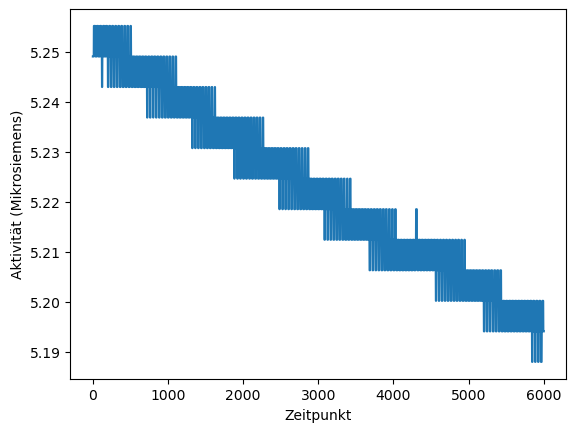

In [5]:
plt.plot(signal_roh[:6000]) # Nur die ersten 3 Sekunden darstellen
plt.xlabel('Zeitpunkt')
plt.ylabel('Aktivität (Mikrosiemens)')
plt.show()

### 1.2 Daten filtern
- Durch die Digitalisierung des Analogsignals ergibt sich eine Treppenähnliche Form des Signals
- Das Signal würden wir deswegen erstmal glätten

In [6]:
import scipy

sos = scipy.signal.butter(N = 4, Wn = [3], btype = 'lowpass', output = "sos", fs = 2000) # Butterworth Tiefpassfilter der 4. Ordnung mit einer Grenzfrequenz von 3 Hz
signal_gefiltert = scipy.signal.sosfiltfilt(sos, signal_roh)

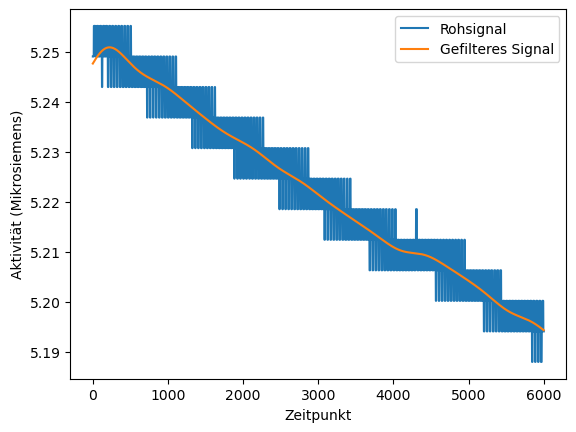

In [7]:
plt.plot(signal_roh[:6000], label = 'Rohsignal') 
plt.plot(signal_gefiltert[:6000], label = 'Gefilteres Signal')
plt.legend()
plt.xlabel('Zeitpunkt')
plt.ylabel('Aktivität (Mikrosiemens)')
plt.show()

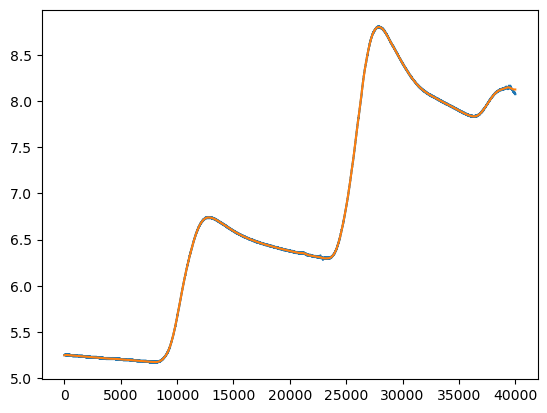

In [8]:
# Darstellung des ganzen Signals
plt.plot(signal_roh, label = 'Rohsignal')
plt.plot(signal_gefiltert, label = 'Gefilteres Signal')

### 1.3 Relevante Merkmale extrahieren
- Was die elektrodermale Aktivität betrifft, sind unter anderem die Spitzen im Signal von Interesse, insbesondere die Höhen der Spitzen
- Das Modul Scipy beinhaltet nützliche Funktionen, um diese Merkmale zu identifizieren

In [9]:
signal = signal_gefiltert[5000:] # Die ersten 2,5 Sekunden werden abgeschnitten
spitzen = scipy.signal.find_peaks(signal)[0] # Spitzen finden, [0] da im ersten Element die Indizes der Spitzen gespeichert sind
spitzen

array([ 7792, 16020, 22894, 34374], dtype=int64)

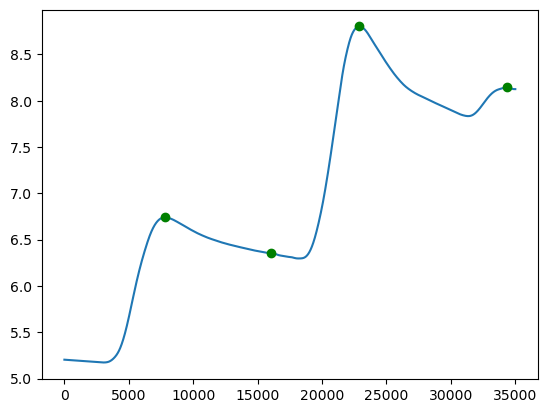

In [10]:
# Spitzen darstellen
plt.plot(signal)
plt.plot(spitzen, signal[spitzen], 'go') # 'go' steht für green und o, also grüne Kreise


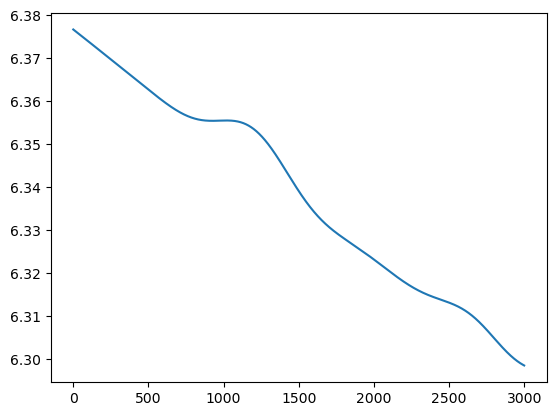

In [11]:
# Spitze in der Mitte näher betrachten
plt.plot(signal[15000:18000])

### Zwischenergebnis
- Die Einstellungen zur Spitzenidentifizierung könnten verbessert werden, um nur Spitzen mit einer bestimmten Mindesthöhe zu identifizieren
- Die Einstellungen schrittweise zu verbessern und die Ergebnisse manuell anzuzeigen und zu überprüfen, ist zeitaufwändig
- Die phasische (schnell variierende) und tonische (langsam variierende) Aktivität müssten aus dem Signal extrahiert werden, damit nur die phasische Aktivität zur Spitzenerkennung genutzt wird
- Gibt es einen effizienteren Weg, z.B. ein maßgeschneidertes Modul für diese spezifische Art der Datenanalyse?

## Teil 2: Analyse mit Neurokit2

> The Python Toolbox for Neurophysiological Signal Processing

> "NeuroKit2 is a user-friendly package providing easy access to advanced biosignal processing routines. Researchers and clinicians without extensive knowledge of programming or biomedical signal processing can analyze physiological data with only two lines of code."

> *Makowski, D., Pham, T., Lau, Z. J., Brammer, J. C., Lespinasse, F., Pham, H., Schölzel, C., & Chen, S. A. (2021). NeuroKit2: A Python toolbox for neurophysiological signal processing. Behavior Research Methods, 53(4), 1689-1696. https://doi.org/10.3758/s13428-020-01516-y*

- Neurokit implementiert Methoden aus der Forschungsliteratur zur neurophysiologischen Datenanalyse, siehe auch [https://neuropsychology.github.io/NeuroKit/](https://neuropsychology.github.io/NeuroKit/)
- Installation: `pip install neurokit2`, für mehr Details siehe [https://neuropsychology.github.io/NeuroKit/installation.html](https://neuropsychology.github.io/NeuroKit/installation.html)


In [12]:
import neurokit2 as nk # Modul importieren
eda_signale, info = nk.eda_process(signal_roh, sampling_rate = 2000) # Automatische Verarbeitung des Signals mit der Funktion eda_process von neurokit2
eda_signale # Ausgabe der verarbeiteten Signale

,EDA_Raw,EDA_Clean,EDA_Tonic,EDA_Phasic,SCR_Onsets,SCR_Peaks,SCR_Height,SCR_Amplitude,SCR_RiseTime,SCR_Recovery,SCR_RecoveryTime
0,5.24902,5.247611,5.279446,-0.027856,0,0,0.0,0.0,0.0,0,0.0
1,5.24902,5.247637,5.279472,-0.027857,0,0,0.0,0.0,0.0,0,0.0
2,5.24902,5.247662,5.279498,-0.027857,0,0,0.0,0.0,0.0,0,0.0
3,5.24902,5.247687,5.279525,-0.027858,0,0,0.0,0.0,0.0,0,0.0
4,5.24902,5.247712,5.279551,-0.027858,0,0,0.0,0.0,0.0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
39994,8.08105,8.125346,7.891595,-0.000076,0,0,0.0,0.0,0.0,0,0.0
39995,8.08105,8.125346,7.891595,-0.000070,0,0,0.0,0.0,0.0,0,0.0
39996,8.08105,8.125346,7.891595,-0.000064,0,0,0.0,0.0,0.0,0,0.0
39997,8.08105,8.125346,7.891595,-0.000058,0,0,0.0,0.0,0.0,0,0.0


In [13]:
info

{'SCR_Onsets': array([ 8560, 23733], dtype=int64),
 'SCR_Peaks': array([12430, 27699], dtype=int64),
 'SCR_Height': array([0.67105351, 1.17439918]),
 'SCR_Amplitude': array([1.1979107 , 2.05950196]),
 'SCR_RiseTime': array([1.935, 1.983]),
 'SCR_Recovery': array([16430., 32116.]),
 'SCR_RecoveryTime': array([2.    , 2.2085]),
 'sampling_rate': 2000}

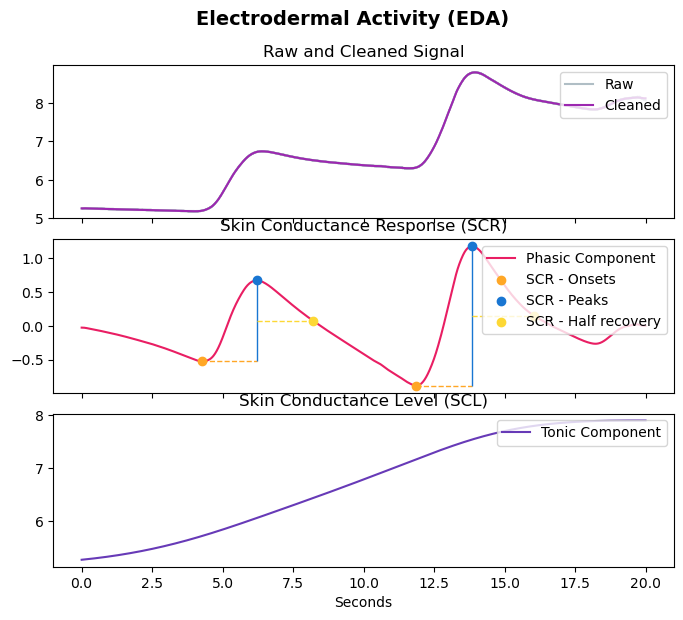

In [14]:
# Darstellung der verarbeiteten Signale
nk.eda_plot(eda_signale, sampling_rate = 2000) # (nutzt das Modul matplotlib (plt) zum plotten)
plt.gcf().set_size_inches(7, 6) # aktuelle Grafik holen (get current figure; gcf) und vergrößern
plt.gcf().suptitle('Electrodermal Activity (EDA)', fontweight = 'bold', fontsize = 14, y = 1.05) # Titel der gesamten Grafik in Fett an Position y = 1.05 (über der Grafik)
plt.show()

In [15]:
# Darstellung des Signals mittels einer interaktiven Grafik
nk.eda_plot(eda_signale, sampling_rate = 2000, static = False) # static = False, damit die Grafik interaktiv ist (nutzt das Modul plotly anstatt matplotlib)

### Generelle Anwendungsmöglichkeiten von Neurokit2

- Physiologische Signale (z.B. EEG, EKG, und EMG) anhand geeigneter Funktionen analysieren, um relevante Merkmale zeitsparend zu identifizieren
- Auch die Simulation einer Vielzahl physiologischer Signale ist mit Neurokit2 möglich
- Siehe [https://neuropsychology.github.io/NeuroKit/introduction.html](https://neuropsychology.github.io/NeuroKit/introduction.html)